# Author: Yingming Liang

In [115]:
#import warning
import warnings
warnings.filterwarnings('ignore')

#import package
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import RocCurveDisplay
from scipy.stats import skew
from scipy.stats import kurtosis
import plotly.offline as py
import plotly.graph_objs as go
import plotly.tools as tls
from plotly.subplots import make_subplots
import plotly.express as px
from shapash.data.data_loader import data_loading
from shapash.explainer.smart_explainer import SmartExplainer
import lime
from lime import lime_tabular
from dtreeviz.trees import *
import dtreeviz
from matplotlib.colors import ListedColormap
import squarify
import plotly.graph_objects as go
from dash import dcc, html, Input, Output, Dash
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC

# PIDD dataset 

In [2]:
#load dataset
diabetes_data = pd.read_csv("diabetes.csv")

In [3]:
diabetes_data.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [4]:
print('Data.describe():\n',diabetes_data.describe(),'\n')
print('Data.dtypes:\n',diabetes_data.dtypes,'\n')
print('Data.info:\n',diabetes_data.info,'\n')
print('Data.isna().sum():\n',diabetes_data.isna().sum(),'\n')
print('Data.nunique():\n',diabetes_data.nunique(),'\n')


Data.describe():
        Pregnancies     Glucose  BloodPressure  SkinThickness     Insulin  \
count   768.000000  768.000000     768.000000     768.000000  768.000000   
mean      3.845052  120.894531      69.105469      20.536458   79.799479   
std       3.369578   31.972618      19.355807      15.952218  115.244002   
min       0.000000    0.000000       0.000000       0.000000    0.000000   
25%       1.000000   99.000000      62.000000       0.000000    0.000000   
50%       3.000000  117.000000      72.000000      23.000000   30.500000   
75%       6.000000  140.250000      80.000000      32.000000  127.250000   
max      17.000000  199.000000     122.000000      99.000000  846.000000   

              BMI  DiabetesPedigreeFunction         Age     Outcome  
count  768.000000                768.000000  768.000000  768.000000  
mean    31.992578                  0.471876   33.240885    0.348958  
std      7.884160                  0.331329   11.760232    0.476951  
min      0.000000

In [6]:
#bar plot
def Bar_plot(df,feature,target):
   
    df_0 = df[df[target]==0][feature]
    df_1 = df[df[target]==1][feature]
    trace_0 = go.Histogram(
        x=df_0,
        opacity=0.65,
    )
    trace_1 = go.Histogram(
        x=df_1,
        opacity=0.65
    )
    trace = [trace_0, trace_1]
    layout = go.Layout(
                       barmode='overlay',
                       title=feature,
                       xaxis=dict(title='Value'),
                       yaxis=dict(title='Count'
        ))
    fig = go.Figure(data=trace, layout=layout)
    py.iplot(fig, filename='overlaid histogram')

In [7]:
Bar_plot(diabetes_data,'Outcome','Outcome')

In [8]:
#drop outcome
df = diabetes_data.drop(columns=['Outcome'])
df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148,72,35,0,33.6,0.627,50
1,1,85,66,29,0,26.6,0.351,31
2,8,183,64,0,0,23.3,0.672,32
3,1,89,66,23,94,28.1,0.167,21
4,0,137,40,35,168,43.1,2.288,33
...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63
764,2,122,70,27,0,36.8,0.340,27
765,5,121,72,23,112,26.2,0.245,30
766,1,126,60,0,0,30.1,0.349,47


In [9]:
#histogram for multiple attributes
for col in df:
    Bar_plot(diabetes_data,col,'Outcome')

In [10]:
#heat plot
def Heat_plot():
    correlation = diabetes_data.corr()
    cols = correlation.columns.tolist()
    corr  = np.array(correlation)
    trace = go.Heatmap(
                       z = corr,
                       x = cols,
                       y = cols,
                       text=corr,
                       texttemplate="%{text:.2f}",
                       colorscale='RdBu_r',
                       colorbar   = dict() ,
                      )
    layout = go.Layout(
                            dict(title = 'Heat map',
                            autosize = False,
                            height  = 700,
                            width   = 900,
                            yaxis   = dict(tickfont = dict(size = 11)),
                            xaxis   = dict(tickfont = dict(size = 11)),
                           )
                      )
    fig = go.Figure(data = [trace],layout = layout)
    
    py.iplot(fig)

In [11]:
Heat_plot()

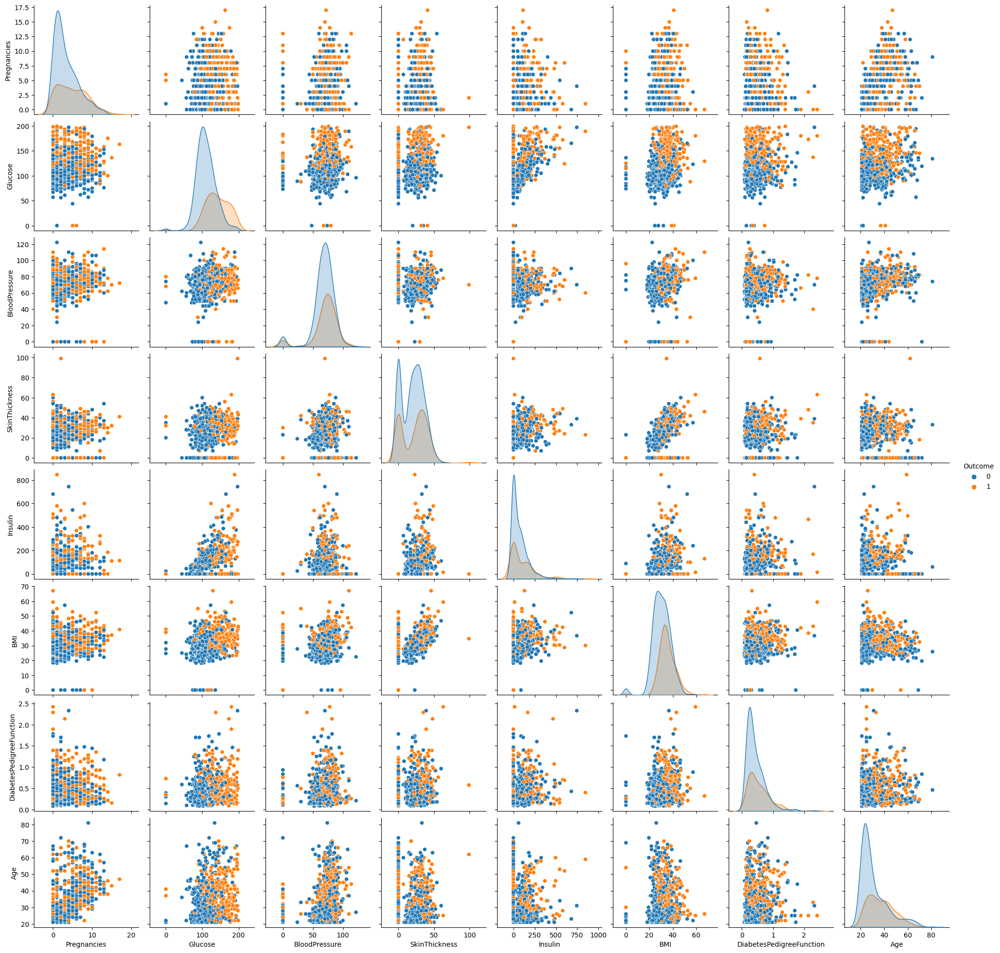

In [12]:
#the correlation of the dataset
def data_correlation():
    
    sns.pairplot(diabetes_data, hue = "Outcome")
    plt.show()
    
data_correlation()

In [13]:
# Remove some top data from features
outlier = diabetes_data['Insulin'].quantile(0.96)
diabetes_data = diabetes_data[diabetes_data['Insulin']<outlier]
outlier = diabetes_data['Pregnancies'].quantile(0.99)
diabetes_data= diabetes_data[diabetes_data['Pregnancies']<outlier]
outlier = diabetes_data['BMI'].quantile(0.99)
diabetes_data = diabetes_data[diabetes_data['BMI']<outlier]
outlier = diabetes_data['SkinThickness'].quantile(0.99)
diabetes_data = diabetes_data[diabetes_data['SkinThickness']<outlier]
outlier = diabetes_data['Age'].quantile(0.99)
diabetes_data = diabetes_data[diabetes_data['Age']<outlier]



In [14]:
df = diabetes_data.drop(columns=['Outcome'])
label = diabetes_data["Outcome"]
label


0      1
1      0
2      1
3      0
4      1
      ..
763    0
764    0
765    0
766    1
767    0
Name: Outcome, Length: 695, dtype: int64

In [15]:
#replacing the 0 in the features values with NaN
zero_cols = [col for col in df.columns if (df[col].min() == 0 and col not in ["Pregnancies"])]

for col in zero_cols:
    df[col] = np.where(df[col] == 0, np.nan, df[col])
print('\nreplacing the 0 in the variables values with NaN.\n',df.isna().sum())



replacing the 0 in the variables values with NaN.
 Pregnancies                   0
Glucose                       5
BloodPressure                32
SkinThickness               213
Insulin                     353
BMI                          10
DiabetesPedigreeFunction      0
Age                           0
dtype: int64


In [18]:
#filling NAN
simple = SimpleImputer(strategy='mean')
imputer = simple.fit(df,label)
df1 = imputer.transform(df)
df1 = pd.DataFrame(df1, columns=df.columns)
print(df1.head())


   Pregnancies  Glucose  BloodPressure  SkinThickness     Insulin   BMI  \
0          6.0    148.0           72.0      35.000000  128.359649  33.6   
1          1.0     85.0           66.0      29.000000  128.359649  26.6   
2          8.0    183.0           64.0      28.122407  128.359649  23.3   
3          1.0     89.0           66.0      23.000000   94.000000  28.1   
4          0.0    137.0           40.0      35.000000  168.000000  43.1   

   DiabetesPedigreeFunction   Age  
0                     0.627  50.0  
1                     0.351  31.0  
2                     0.672  32.0  
3                     0.167  21.0  
4                     2.288  33.0  


In [19]:
#scaling the Dataset
SS = StandardScaler()
df_scaled = SS.fit_transform(df1[df1.columns])
df_scaled = pd.DataFrame(df_scaled, columns=df1.columns)
print(df_scaled.head())


   Pregnancies   Glucose  BloodPressure  SkinThickness   Insulin       BMI  \
0     0.744637  0.964409      -0.009403       0.884782  0.000000  0.260914   
1    -0.857601 -1.173422      -0.514888       0.112900  0.000000 -0.841556   
2     1.385533  2.152093      -0.683384       0.000000  0.000000 -1.361292   
3    -0.857601 -1.037687      -0.514888      -0.658983 -0.718620 -0.605313   
4    -1.178049  0.591137      -2.705325       0.884782  0.829064  1.757124   

   DiabetesPedigreeFunction       Age  
0                  0.518115  1.581670  
1                 -0.353238 -0.144442  
2                  0.660183 -0.053594  
3                 -0.934140 -1.052922  
4                  5.762019  0.037254  


In [20]:
#spliting of data
x_train, x_test, y_train, y_test = train_test_split(df_scaled, label, test_size = 0.2, random_state=42)
xx_train, xx_test, yy_train, yy_test = train_test_split(df1, label, test_size = 0.2, random_state=42)
x_train, x_test, y_train, y_test.head()

(     Pregnancies   Glucose  BloodPressure  SkinThickness   Insulin       BMI  \
 110     0.744637 -0.291142      -0.683384       1.399371  0.000000  0.355412   
 82     -0.857601 -1.343091      -1.441612       0.000000  0.000000 -2.022774   
 51     -0.857601 -1.580628      -1.862849      -2.331395  0.000000 -1.408541   
 218     0.744637 -0.019672      -1.862849      -0.787630  0.996381 -0.762808   
 557     0.744637 -0.087539       2.012538       0.000000  0.000000 -0.510815   
 ..           ...       ...            ...            ...       ...       ...   
 71      0.424190 -0.834084      -0.009403       0.627488  0.000000  0.906647   
 106     0.424190  0.149997       0.159092       0.000000  0.000000  0.323912   
 270    -0.537153  0.014262       0.327587       1.142076 -0.488559  1.221638   
 435    -1.178049  0.862608       0.000000       0.000000  0.000000  1.930369   
 102    -0.857601 -1.037687       0.327587       0.756135 -1.910755 -0.117076   
 
      DiabetesPedigreeFunc

# Another diabetes dataset

In [21]:
#another dataset
diabetes_Another = pd.read_csv('diabetes_dataset__2019.csv')
diabetes_Another.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 952 entries, 0 to 951
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Age               952 non-null    object 
 1   Gender            952 non-null    object 
 2   Family_Diabetes   952 non-null    object 
 3   highBP            952 non-null    object 
 4   PhysicallyActive  952 non-null    object 
 5   BMI               948 non-null    float64
 6   Smoking           952 non-null    object 
 7   Alcohol           952 non-null    object 
 8   Sleep             952 non-null    int64  
 9   SoundSleep        952 non-null    int64  
 10  RegularMedicine   952 non-null    object 
 11  JunkFood          952 non-null    object 
 12  Stress            952 non-null    object 
 13  BPLevel           952 non-null    object 
 14  Pregancies        910 non-null    float64
 15  Pdiabetes         951 non-null    object 
 16  UriationFreq      952 non-null    object 
 1

In [22]:
diabetes_Another.head()

,Age,Gender,Family_Diabetes,highBP,PhysicallyActive,BMI,Smoking,Alcohol,Sleep,SoundSleep,RegularMedicine,JunkFood,Stress,BPLevel,Pregancies,Pdiabetes,UriationFreq,Diabetic
0,50-59,Male,no,yes,one hr or more,39.0,no,no,8,6,no,occasionally,sometimes,high,0.0,0,not much,no
1,50-59,Male,no,yes,less than half an hr,28.0,no,no,8,6,yes,very often,sometimes,normal,0.0,0,not much,no
2,40-49,Male,no,no,one hr or more,24.0,no,no,6,6,no,occasionally,sometimes,normal,0.0,0,not much,no
3,50-59,Male,no,no,one hr or more,23.0,no,no,8,6,no,occasionally,sometimes,normal,0.0,0,not much,no
4,40-49,Male,no,no,less than half an hr,27.0,no,no,8,8,no,occasionally,sometimes,normal,0.0,0,not much,no


# Random Forest

In [24]:
#random forest
RF = RandomForestClassifier(n_estimators=500, random_state=42)
RF.fit(xx_train, yy_train)

predict_test_RF = RF.predict_proba(xx_test)
y_predict_RF = pd.DataFrame(
{
    "Outcome": predict_test_RF[:, 1],
},
index = yy_test.index
    )
print("y_predict.shape:", y_predict_RF.shape)
print('\nROC: ',roc_auc_score(yy_test, y_predict_RF))
print('Score: ',RF.score(xx_test, yy_test))

y_predict.shape: (139, 1)

ROC:  0.8653576437587658
Score:  0.841726618705036


In [25]:
#hyperparameter optimization
param_grid_RF = {
    'n_estimators': [400, 600],
    'max_depth': [4,5,6],
    'min_samples_split': [1,2,4],
    'min_samples_leaf': [1,2,4]
    }
    
random_forest = RandomForestClassifier(random_state=42)
grid_search_RF = GridSearchCV(random_forest, param_grid_RF, cv=5, scoring='accuracy')
grid_search_RF.fit(xx_train, yy_train)

print("Best Parameters:", grid_search_RF.best_params_)
print("Best Score:", grid_search_RF.best_score_)

Best Parameters: {'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 600}
Best Score: 0.767985842985843


In [26]:
#random forest with optimal parameters
RF_1 = RandomForestClassifier(n_estimators=600,
                              max_depth=5,#6
                              max_features='auto',
                              min_samples_leaf=1,#1
                              min_samples_split=2, #4
                              random_state=42)
RF_1.fit(xx_train, yy_train)

predict_test_RF_1 = RF_1.predict_proba(xx_test)
y_predict_RF_1 = pd.DataFrame(
    {
          "Outcome": predict_test_RF_1[:, 1],
     },
    index = yy_test.index
    )
print("shape:", y_predict_RF_1.shape)
print("roc_auc_score:",roc_auc_score(yy_test, y_predict_RF_1))

shape: (139, 1)
roc_auc_score: 0.8623188405797102


In [27]:
#10-fold cross validation
scores = cross_val_score(RF_1, df1, label, cv=10, scoring='roc_auc')
for i, score in enumerate(scores):
    print(f"Fold {i+1}: {score:.3f}")
print(f"Mean AUC score: {scores.mean():.3f}")

Fold 1: 0.813
Fold 2: 0.844
Fold 3: 0.824
Fold 4: 0.808
Fold 5: 0.802
Fold 6: 0.851
Fold 7: 0.858
Fold 8: 0.916
Fold 9: 0.833
Fold 10: 0.884
Mean AUC score: 0.843


In [30]:
#10-fold cross-validation graph
num_cv_runs = 10
scores = cross_val_score(RF_1, df1, label, cv=10, scoring='roc_auc')
cv_runs = np.arange(1, num_cv_runs + 1)

fig = px.line(x=cv_runs, y=scores, labels={'x': 'CV Run', 'y': 'AUC '}, title='Random Forest 10-fold Cross-Validation')

fig.update_layout(
    xaxis=dict(tickvals=cv_runs),
    xaxis_title='CV Run',
    yaxis_title=' AUC ',
)

fig.show()


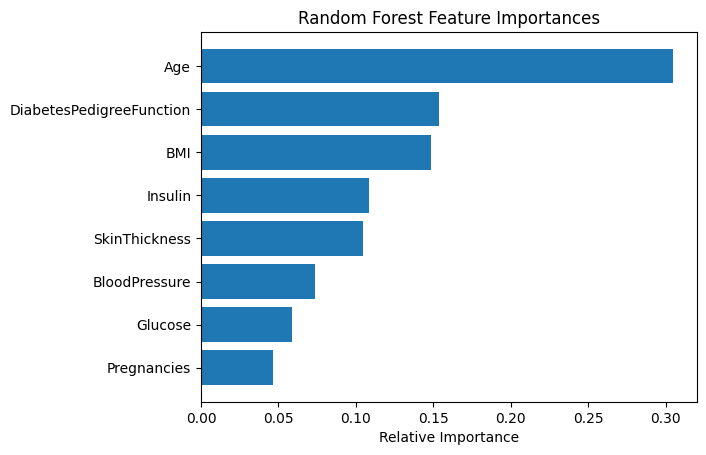

In [31]:
#random forest feature importance
importances_RF = RF_1.feature_importances_[:10]
indices = np.argsort(importances_RF)
plt.title('Random Forest Feature Importances')
plt.barh(range(len(indices)), importances_RF[indices],  align = 'center')
plt.yticks(range(len(indices)), df)
plt.xlabel('Relative Importance')
plt.show()


In [36]:
#random forest roc/auc
fpr, tpr, _ = roc_curve(yy_test, y_predict_RF_1)
roc_auc = auc(fpr, tpr)

fig = px.area(
    x=fpr,
    y=tpr,
    title=f'ROC Curve of Random Forest (AUC = {roc_auc:.2f})',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
)
fig.add_shape(type='line', line=dict(dash='dash'), x0=0, x1=1, y0=0, y1=1)
fig.update_xaxes(constrain='domain')
fig.update_yaxes(scaleanchor='x', scaleratio=1)
fig.show()


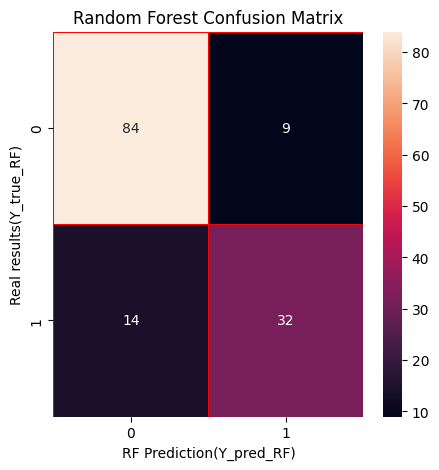

In [35]:
#Confusion Matrix

y_prediciton_RF= RF_1.predict(xx_test)
y_true_RF = yy_test

CM_RF = confusion_matrix(y_true_RF,y_prediciton_RF)

f, ax = plt.subplots(figsize=(5,5))
sns.heatmap(CM_RF, annot = True, linewidths=0.5,linecolor="red",fmt=".0f",ax=ax)
plt.title('Random Forest Confusion Matrix')
plt.xlabel("RF Prediction(Y_pred_RF)")
plt.ylabel("Real results(Y_true_RF)")
plt.show()

In [37]:
#Show metrics
tp = CM_RF[1,1]
fn = CM_RF[1,0]
fp = CM_RF[0,1]
tn = CM_RF[0,0]

Accuracy  =  ((tp+tn)/(tp+tn+fp+fn))
Precision =  (tp/(tp+fp))
Recall    =  (tp/(tp+fn))
F1_score  =  (2*(((tp/(tp+fp))*(tp/(tp+fn)))/((tp/(tp+fp))+(tp/(tp+fn)))))

show_metrics = pd.DataFrame(data=[[Accuracy , Precision, Recall, F1_score]])
show_metrics = show_metrics.T

colors = ['lightblue', 'lightgreen', 'lightcoral', 'lightskyblue']

fig = go.Figure(go.Bar(x = (show_metrics[0].values), 
                    y = ['Accuracy', 'Precision', 'Recall', 'F1_score'], text = np.round_(show_metrics[0].values,4),
                    textposition = 'auto', orientation = 'h', opacity = 1, marker=dict(
            color=colors,
            line=dict(color='#000000',width=1))))

fig.update_layout(
    title='Random Forest preformance',
)

fig.show()

In [38]:
print(classification_report(yy_test, y_prediciton_RF))

              precision    recall  f1-score   support

           0       0.86      0.90      0.88        93
           1       0.78      0.70      0.74        46

    accuracy                           0.83       139
   macro avg       0.82      0.80      0.81       139
weighted avg       0.83      0.83      0.83       139



In [39]:
#shap
import shap
Shap_explainer_RF = shap.TreeExplainer(RF_1)
shap_values_RF = Shap_explainer_RF.shap_values(xx_test)
shap_values_RF[0]


array([[ 0.00950868, -0.26572976, -0.00490309, ..., -0.04983815,
         0.04974699, -0.06269717],
       [ 0.02124486,  0.10496935,  0.01312246, ..., -0.04611323,
         0.0035533 ,  0.08210124],
       [ 0.00331002,  0.04380959,  0.00098783, ..., -0.03834856,
         0.04070212, -0.06389473],
       ...,
       [-0.00640463,  0.17407432, -0.00586283, ..., -0.02943351,
         0.00408486, -0.07716731],
       [ 0.02423338,  0.05110064, -0.00595818, ..., -0.07712243,
        -0.03463445,  0.08862287],
       [ 0.0144333 ,  0.02258236,  0.00676236, ...,  0.08079151,
         0.0211364 ,  0.05265999]])

In [41]:
# feature importance of the random forest model
feature_importance_RF = pd.DataFrame()
feature_importance_RF['variable'] = xx_train.columns
feature_importance_RF['importance'] = RF_1.feature_importances_

feature_importance_RF.sort_values(by='importance', ascending=False).head(10)

,variable,importance
1,Glucose,0.305039
7,Age,0.153981
5,BMI,0.148552
4,Insulin,0.108397
6,DiabetesPedigreeFunction,0.104914
3,SkinThickness,0.073632
0,Pregnancies,0.058910
2,BloodPressure,0.046575


In [43]:
#Load JS code for visualization
shap.initjs()  

In [44]:
#shap force plot
shap.force_plot(Shap_explainer_RF.expected_value[0], shap_values_RF[0][0, :], xx_test.iloc[0, :])
                  

In [45]:
shap.force_plot(Shap_explainer_RF.expected_value[0], shap_values_RF[0],features=xx_test,feature_names=xx_test.columns)

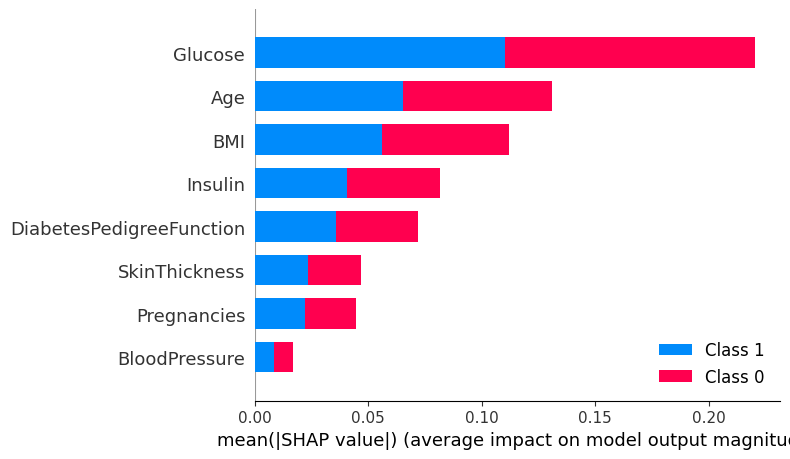

In [46]:
#shap summary plot
shap.summary_plot(shap_values_RF, features=xx_test, feature_names=xx_test.columns)

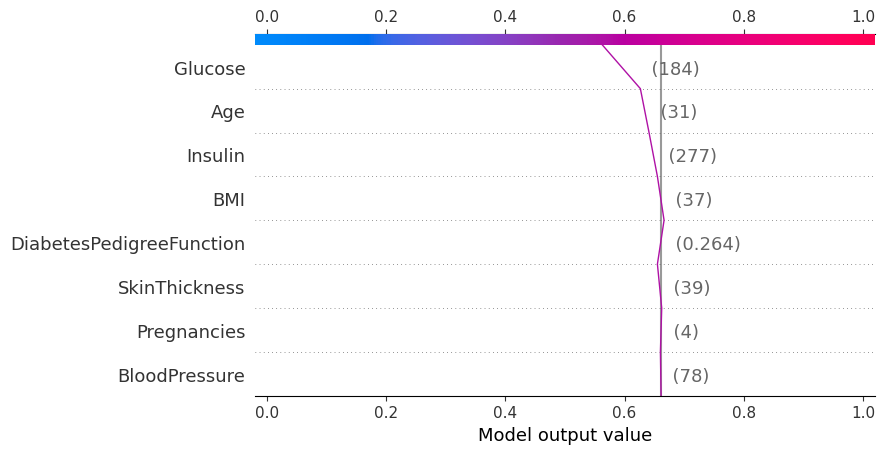

In [47]:
#shap decision plot
shap.decision_plot(Shap_explainer_RF.expected_value[0], shap_values_RF[0][0, :], features=xx_test, link='logit')

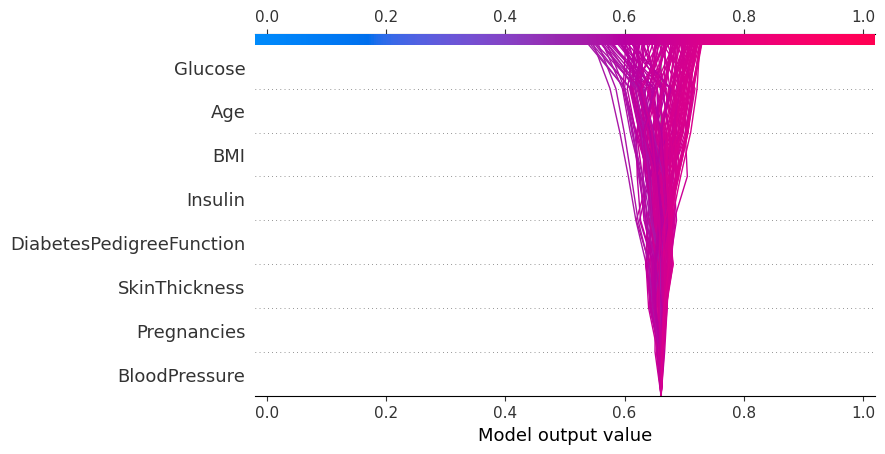

In [48]:
shap.decision_plot(Shap_explainer_RF.expected_value[0], shap_values_RF[0], features=xx_test, link='logit')

In [50]:
#using lime

Lime_explainer_RF = lime_tabular.LimeTabularExplainer(
    training_data=np.array(xx_train),
    feature_names=xx_train.columns,
    class_names=['0', '1'],
    mode='classification'
)

exp_RF = Lime_explainer_RF.explain_instance(data_row=xx_test.iloc[0], predict_fn=RF_1.predict_proba)
exp_RF.show_in_notebook(show_table=True)

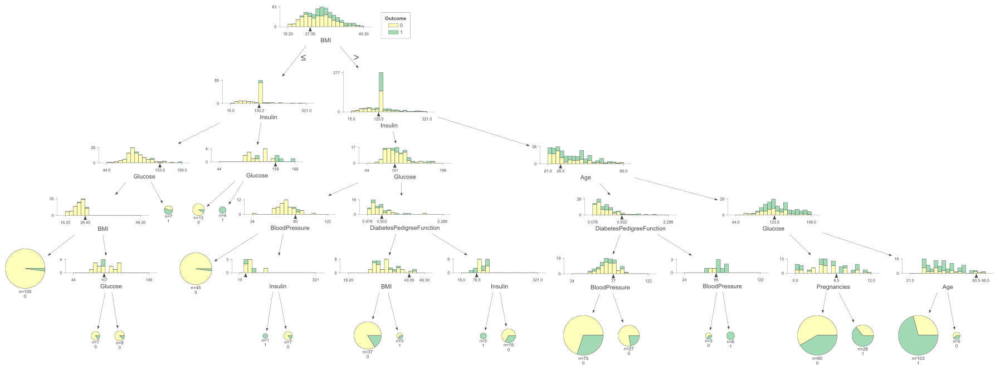

In [53]:

#using detreeviz
viz_model_RF = dtreeviz.model(RF_1.estimators_[0],
                              X_train=xx_train, 
                              y_train=yy_train,
                              feature_names=xx_train.columns,
                              target_name='Outcome', 
                              class_names=["0","1"]
                             )
viz_model_RF.view(scale=1.2)

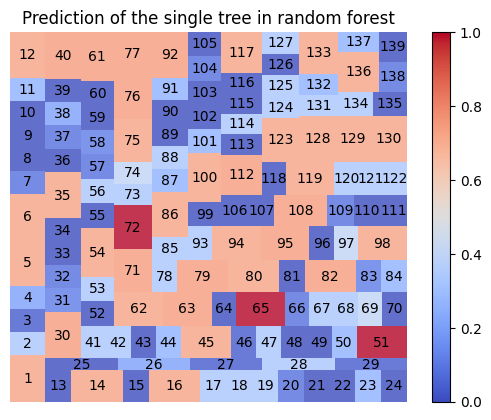

In [55]:
#A single tree corresponds to all data sets
tree_inRF = RF_1.estimators_[0]

tree_predictions_RF = tree_inRF.predict(xx_test)
tree_predictions_RF_1 = tree_inRF.predict_proba(xx_test)
tree_predictions_RF_2 = tree_predictions_RF_1[:,1].tolist() 

labels = [f"{i + 1}" for i in range(len(tree_predictions_RF))]

sizes = tree_predictions_RF+1

cmap = plt.cm.get_cmap('coolwarm')
norm = plt.Normalize(vmin=min(tree_predictions_RF_2  ), vmax=max(tree_predictions_RF_2  ))

colors = [cmap(norm(size)) for size in tree_predictions_RF_2 ]

squarify.plot(sizes=sizes, label=labels, color=colors, alpha=0.8)

sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])  
plt.colorbar(sm)

plt.axis('off')
plt.title("Prediction of the single tree in random forest")

plt.show()

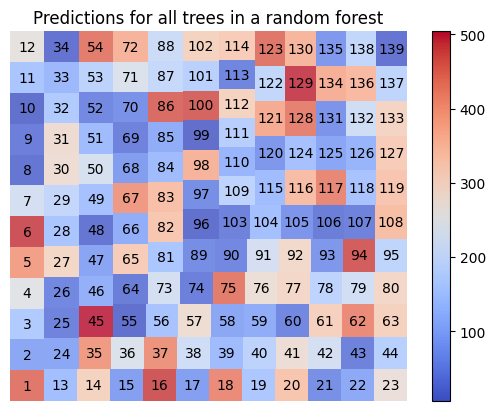

In [56]:
# Total votes for all trees
tree_votes = np.array([tree.predict_proba(xx_test) for tree in RF_1.estimators_])

tree_sum_results = np.sum(tree_votes, axis=0)

tree_sum = tree_sum_results[:,1].tolist() 
labels = [f"{i + 1}" for i in range(len(tree_sum ))]

sizes = [1]*len(tree_sum )

cmap = plt.cm.get_cmap('coolwarm')
norm = plt.Normalize(vmin=min(tree_sum ), vmax=max(tree_sum ))

colors = [cmap(norm(size)) for size in tree_sum]

squarify.plot(sizes=sizes, label=labels, color=colors, alpha=0.8)

sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])  
plt.colorbar(sm)

plt.axis('off')
plt.title("Predictions for all trees in a random forest")

plt.show()


In [57]:
#Treemap of a single tree in random forest

tree_in_RF = RF_1.estimators_[0]

tree_structure = tree_in_RF.tree_

def get_node(node_id, parent):
    if node_id == -1:
        return None
    else:
        node = {
            "node": f"{xx_test.columns[tree_structure.feature[node_id]]} decision value= {float(tree_structure.threshold[node_id]):.2f}" 
             if parent != "" else f"{xx_test.columns[tree_structure.feature[node_id]]} decision value= {float(tree_structure.threshold[node_id]):.2f}",
            "parent": parent,
        }
        left_child = get_node(tree_structure.children_left[node_id], node["node"])
        right_child = get_node(tree_structure.children_right[node_id], node["node"])
        if left_child:
            node["left_child"] = left_child
        if right_child:
            node["right_child"] = right_child
        return node

root_node = get_node(0, "",)

def flatten_nodes(node):
    nodes = [{"node": node["node"], "parent": node["parent"]}]
    if "left_child" in node:
        nodes.extend(flatten_nodes(node["left_child"]))
    if "right_child" in node:
        nodes.extend(flatten_nodes(node["right_child"]))
    return nodes

nodes = flatten_nodes(root_node)


fig = go.Figure(go.Treemap(
    labels=[node["node"] for node in nodes],
    parents=[node["parent"] for node in nodes],

))

fig.update_layout(
    title='Visualization of Tree in Random Forest',
)

fig.show()

node=None
nodes=None


In [60]:
#Treemap of two trees in random forest

rows = 1
cols = 2

fig = make_subplots(
    rows=rows, 
    cols=cols,
    horizontal_spacing = 0.02,
    start_cell="top-left", 
    specs=[
        [{"type": "Treemap"}, {"type": "Treemap"}],
    ]
)


for i in range(2):
    
    tree_in_RF = RF_1.estimators_[i]

    tree_structure = tree_in_RF.tree_

    root_node = get_node(0, '',)

    nodes = flatten_nodes(root_node)
    
    labels=[node["node"] for node in nodes]
    parents=[node["parent"] for node in nodes]
    customdata=[node["node"] for node in nodes]
    
    treemap=go.Treemap(
        labels=labels,
        parents=parents,
        customdata=[node["node"] for node in nodes],
    )
    
    fig.add_trace(treemap,row=1, col=i+1)

    root_node = None
    nodes = None

fig.update_layout(title='Treemaps of 2 Decision Tree in Random Forest')
fig.show()
  

def get_node(node_id, parent):
    if node_id == -1:
        return None
    else:
        node = {
            "node": f"{x_test.columns[tree_structure.feature[node_id]]} decision value= {float(tree_structure.threshold[node_id]):.2f}" 
             if parent != "" else f"{x_test.columns[tree_structure.feature[node_id]]} decision value= {float(tree_structure.threshold[node_id]):.2f}",
            "parent": parent,
        }
        left_child = get_node(tree_structure.children_left[node_id], node["node"])
        right_child = get_node(tree_structure.children_right[node_id], node["node"])
        if left_child:
            node["left_child"] = left_child
        if right_child:
            node["right_child"] = right_child
        return node


def flatten_nodes(node):
    nodes = [{"node": node["node"], "parent": node["parent"]}]
    if "left_child" in node:
        nodes.extend(flatten_nodes(node["left_child"]))
    if "right_child" in node:
        nodes.extend(flatten_nodes(node["right_child"]))
    return nodes

In [65]:
# Traverse each of the 50 trees and get the information
accuracies = []
ROC_AUC_TREE = []
RECALL_RF_DT = []
for tree in RF_1.estimators_[:50]:
    y_predd = tree.predict(x_test)
    accuracy = accuracy_score(y_test, y_predd)
    accuracies.append(round(accuracy, 2))
    
    predict_test_rf_tree = tree.predict_proba(xx_test)
    y_predict_rf_tree = pd.DataFrame(
    {
          "Outcome": predict_test_rf_tree[:, 1],
     },
    index = yy_test.index
    )
    
    y_pred_rf_dt = tree.predict(xx_test)
    recall_rf_dt = recall_score(yy_test, y_pred_rf_dt)
    RECALL_RF_DT.append(round(recall_rf_dt, 3))
    
    fpr, tpr, _ = roc_curve(yy_test, y_predict_rf_tree)
    roc_auc_tree = auc(fpr, tpr)
    ROC_AUC_TREE.append(round(roc_auc_tree-0.5, 3))
    

reciprocal_values = [val for val in ROC_AUC_TREE]
colors_values = [vals for vals in RECALL_RF_DT]



In [66]:

#Create an interactive treemap using dash
app = Dash(__name__)

@app.callback(
    Output('output-click', 'children'),
    Input('click-graph', 'clickData')
)
def handle_click(click_data):
    if click_data:
        point_data = click_data['points'][0]
        n = point_data['pointNumber']
        result = run_RF(n)
        return result
    return ""

colors=colors_values

app.layout = html.Div([
    dcc.Graph(
        id='click-graph',
        config={'staticPlot': False, 'displayModeBar': True},
        figure={
            'data': [
                go.Treemap(
                   labels=[f'Tree {i}' for i in range(1, 51)],
                   parents=[''] * 50,
                   values=reciprocal_values,
                   customdata=list(range(1, 51)),
                   #marker_colorscale = 'RdBu',
                    marker=dict(
                           colors=colors,
                           colorscale="RdBu", 
                           colorbar=dict(
                                    title="Recall of DT in RF"
                                       ),
                              ),
                )
            ],
            'layout': {
                'title': '50 trees in Random forest',
            }
        }
    ),
    html.Div(id='output-click')
])

if __name__ == '__main__':
    app.run_server(debug=True)


In [67]:
#Method to generate treemap
def run_RF(n):

    tree_in_RF = RF_1.estimators_[n]

    tree_structure = tree_in_RF.tree_

    def get_node(node_id, parent):
        if node_id == -1:
            return None
        else:
            node = {
            "node": f"{xx_test.columns[tree_structure.feature[node_id]]} decision value= {float(tree_structure.threshold[node_id]):.2f}" 
             if parent != "" else f"{xx_test.columns[tree_structure.feature[node_id]]} decision value= {float(tree_structure.threshold[node_id]):.2f}",
            "parent": parent,
            }
            left_child = get_node(tree_structure.children_left[node_id], node["node"])
            right_child = get_node(tree_structure.children_right[node_id], node["node"])
            if left_child:
                node["left_child"] = left_child
            if right_child:
                node["right_child"] = right_child
            return node

    root_node = get_node(0, "",)


    def flatten_nodes(node):
        nodes = [{"node": node["node"], "parent": node["parent"]}]
        if "left_child" in node:
            nodes.extend(flatten_nodes(node["left_child"]))
        if "right_child" in node:
            nodes.extend(flatten_nodes(node["right_child"]))
        return nodes


    nodes = flatten_nodes(root_node)



    fig = go.Figure(go.Treemap(
        labels=[node["node"] for node in nodes],
        parents=[node["parent"] for node in nodes],

    ))


    fig.update_layout(

        title=f'This is the {n+1}nd tree of the random forest'
    )


    fig.show()

    node=None
    nodes=None



# Decision Tree

In [70]:
#decision tree
DTC = DecisionTreeClassifier(random_state=42)
DTC.fit(xx_train, yy_train)

predict_test_DTC = DTC.predict_proba(xx_test)
y_predict_DTC = pd.DataFrame(
{
    "Outcome": predict_test_DTC[:, 1],
},
index = yy_test.index
    )
print("y_predict.shape:", y_predict_DTC.shape)
#print('\n',y_predict_RF.head())
print('ROC: ',roc_auc_score(yy_test, y_predict_DTC))
print('Score: ',DTC.score(xx_test, yy_test))



y_predict.shape: (139, 1)
ROC:  0.7129499766245909
Score:  0.7482014388489209


In [71]:
#Use GridSearchCV to find optimal parameters
param_grid_DTC = {
    'max_depth':[5,6,7,8],
    'max_leaf_nodes':[10,15,20],
    'min_samples_split': [1,2,4],
    'min_samples_leaf': [5,10,15,20]
}
grid_search_DTC = GridSearchCV(DTC, param_grid_DTC, cv=5, scoring='accuracy')
grid_search_DTC.fit(xx_train,yy_train)

print("Best Parameters:", grid_search_DTC.best_params_)
print("Best Score:", grid_search_DTC.best_score_)
    

Best Parameters: {'max_depth': 7, 'max_leaf_nodes': 15, 'min_samples_leaf': 15, 'min_samples_split': 2}
Best Score: 0.735601673101673


In [72]:
#decision tree with optimal parameters
DTC_1 = DecisionTreeClassifier(max_depth=7,
                               max_leaf_nodes=15,
                               min_samples_leaf=15,
                               min_samples_split=2,
                               random_state=42
                               )
DTC_1.fit(xx_train, yy_train)

predict_test_DTC_1 = DTC_1.predict_proba(xx_test)
y_predict_DTC_1 = pd.DataFrame(
{
    "Outcome": predict_test_DTC_1[:, 1],
},
index = yy_test.index
    )

print('ROC: ',roc_auc_score(yy_test, y_predict_DTC_1))
print('Score: ',DTC_1.score(xx_test, yy_test))

ROC:  0.8839410939691444
Score:  0.8129496402877698


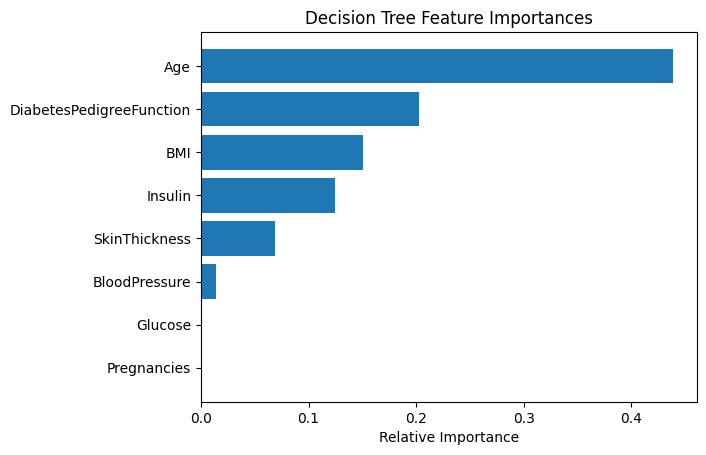

In [73]:
#feature importance
importances_DTC = DTC_1.feature_importances_[:10]
indices = np.argsort(importances_DTC)
plt.title('Decision Tree Feature Importances')
plt.barh(range(len(indices)), importances_DTC[indices],  align = 'center')
plt.yticks(range(len(indices)), df)
plt.xlabel('Relative Importance')
plt.show()


In [74]:
#roc curve and auc
fpr, tpr, _ = roc_curve(yy_test, y_predict_DTC_1)
roc_auc = auc(fpr, tpr)

fig = px.area(
    x=fpr,
    y=tpr,
    title=f'ROC Curve of Decision Tree (AUC = {roc_auc:.2f})',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
)
fig.add_shape(type='line', line=dict(dash='dash'), x0=0, x1=1, y0=0, y1=1)
fig.update_xaxes(constrain='domain')
fig.update_yaxes(scaleanchor='x', scaleratio=1)
fig.show()

In [75]:
# 10-fold cross validation
scores = cross_val_score(DTC_1, df1, label, cv=10, scoring='roc_auc')
for i, score in enumerate(scores):
    print(f"Fold {i+1}: {score:.3f}")
#print(f"Mean AUC score: {scores.mean():.2f}"

Fold 1: 0.777
Fold 2: 0.790
Fold 3: 0.763
Fold 4: 0.744
Fold 5: 0.733
Fold 6: 0.833
Fold 7: 0.822
Fold 8: 0.833
Fold 9: 0.778
Fold 10: 0.854


In [76]:
num_cv_runs = 10
scores = cross_val_score(DTC_1, df1, label, cv=10, scoring='roc_auc')
cv_runs = np.arange(1, num_cv_runs + 1)

fig = px.line(x=cv_runs, y=scores, labels={'x': 'CV Run', 'y': 'AUC '}, title='Decision tree 10-fold Cross-Validation')

fig.update_layout(
    xaxis=dict(tickvals=cv_runs),
    xaxis_title='CV Run',
    yaxis_title=' AUC ',
)

fig.show()


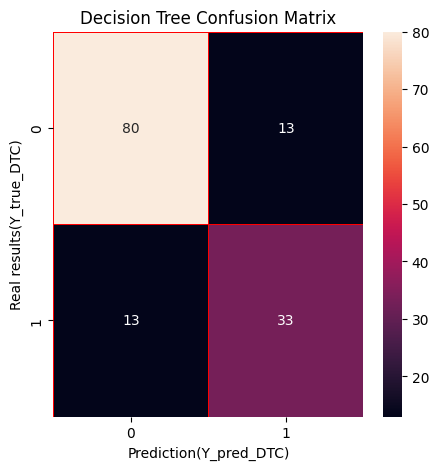

In [77]:
#Confusion Matrix

y_prediciton_DTC= DTC_1.predict(xx_test)
y_true_DTC = yy_test

from sklearn.metrics import confusion_matrix
CM_DTC = confusion_matrix(y_true_DTC,y_prediciton_DTC)

f, ax = plt.subplots(figsize=(5,5))
sns.heatmap(CM_DTC, annot = True, linewidths=0.5,linecolor="red",fmt=".0f",ax=ax)
plt.title('Decision Tree Confusion Matrix')
plt.xlabel("Prediction(Y_pred_DTC)")
plt.ylabel("Real results(Y_true_DTC)")
plt.show()

In [78]:
#Show metrics
tp = CM_DTC[1,1]
fn = CM_DTC[1,0]
fp = CM_DTC[0,1]
tn = CM_DTC[0,0]

Accuracy  =  ((tp+tn)/(tp+tn+fp+fn))
Precision =  (tp/(tp+fp))
Recall    =  (tp/(tp+fn))
F1_score  =  (2*(((tp/(tp+fp))*(tp/(tp+fn)))/((tp/(tp+fp))+(tp/(tp+fn)))))

show_metrics = pd.DataFrame(data=[[Accuracy , Precision, Recall, F1_score]])
show_metrics = show_metrics.T

colors = ['lightblue', 'lightgreen', 'lightcoral', 'lightskyblue']

fig = go.Figure(go.Bar(x = (show_metrics[0].values), 
                    y = ['Accuracy', 'Precision', 'Recall', 'F1_score'], text = np.round_(show_metrics[0].values,4),
                    textposition = 'auto', orientation = 'h', opacity = 1, marker=dict(
            color=colors,
            line=dict(color='#000000',width=1))))


fig.update_layout(
    title='Decision Tree preformance',
)


fig.show()

In [79]:
print(classification_report(y_test, y_prediciton_DTC))

              precision    recall  f1-score   support

           0       0.86      0.86      0.86        93
           1       0.72      0.72      0.72        46

    accuracy                           0.81       139
   macro avg       0.79      0.79      0.79       139
weighted avg       0.81      0.81      0.81       139



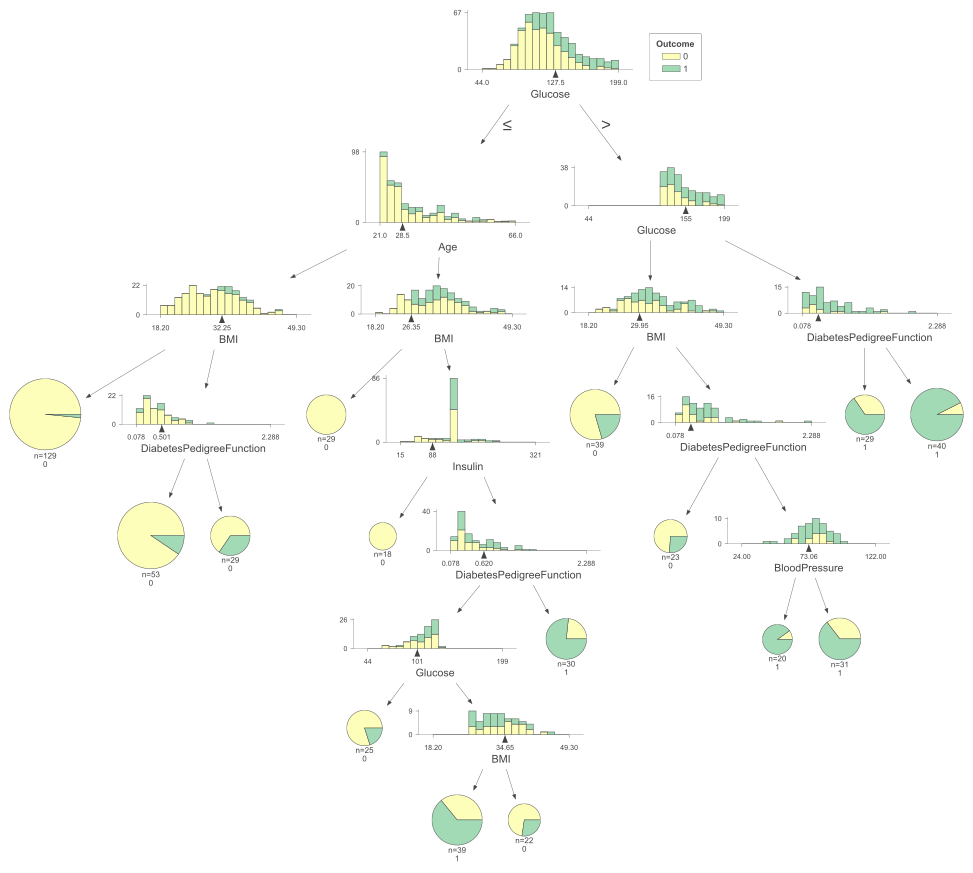

In [81]:
#decision tree dtreeviz
viz_model = dtreeviz.model(DTC_1,
                           xx_train, yy_train,
                           feature_names=xx_train.columns,
                           target_name='Outcome', class_names=["0", "1"])
viz_model.view(scale=1.2)

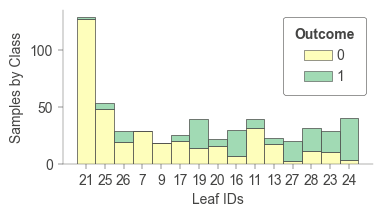

In [82]:
viz_model.ctree_leaf_distributions(figsize=(4,2))

In [83]:
#Use lime 
Lime_explainer_DTC = lime_tabular.LimeTabularExplainer(
    training_data=np.array(xx_train),
    feature_names=xx_train.columns,
    class_names=['0', '1'],
    mode='classification'
)

In [84]:
exp_DTC = Lime_explainer_DTC.explain_instance(data_row=xx_test.iloc[0], predict_fn=DTC_1.predict_proba)
exp_DTC.show_in_notebook(show_table=True)

In [85]:
# feature importance of the decision tree
feature_importance_DTC = pd.DataFrame()
feature_importance_DTC['variable'] = xx_test.columns
feature_importance_DTC['importance'] = DTC_1.feature_importances_

feature_importance_DTC.sort_values(by='importance', ascending=False).head(10)

,variable,importance
1,Glucose,0.439080
5,BMI,0.202426
6,DiabetesPedigreeFunction,0.151042
7,Age,0.124820
4,Insulin,0.069099
2,BloodPressure,0.013533
0,Pregnancies,0.000000
3,SkinThickness,0.000000


In [86]:

Shap_explainer_DTC = shap.TreeExplainer(DTC_1)
shap_values_DTC = Shap_explainer_DTC.shap_values(xx_test)
shap_values_DTC[0]

array([[ 0.        , -0.39832938,  0.00345822, ..., -0.00970476,
         0.13687671, -0.04625805],
       [ 0.        ,  0.21409207, -0.00970177, ..., -0.06330335,
         0.04049382,  0.06249014],
       [ 0.        ,  0.11831612, -0.00536024, ..., -0.01151145,
         0.07060381, -0.02799069],
       ...,
       [ 0.        ,  0.26737208,  0.0062592 , ..., -0.05108044,
         0.05476864, -0.1211193 ],
       [ 0.        ,  0.12812446,  0.0062592 , ..., -0.12383534,
        -0.13822102,  0.1257181 ],
       [ 0.        ,  0.12438455, -0.00355216, ...,  0.08954796,
         0.04017193,  0.02511749]])

In [87]:
#load shap and force plot
shap.initjs()  
shap.force_plot(Shap_explainer_DTC.expected_value[0], shap_values_DTC[0][0, :], xx_test.iloc[0, :])
                    

In [88]:
shap.force_plot(Shap_explainer_DTC.expected_value[0], shap_values_DTC[0],features=xx_test,feature_names=xx_test.columns)

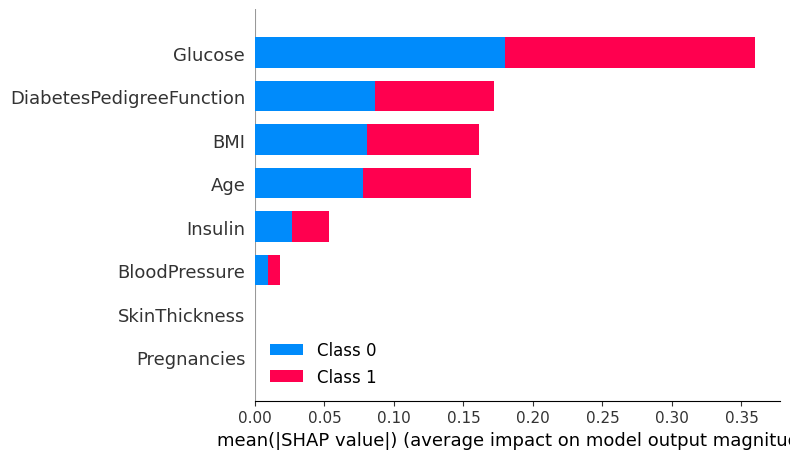

In [89]:
#summary plot of decision tree
shap.summary_plot(shap_values_DTC, features=xx_test, feature_names=xx_test.columns)

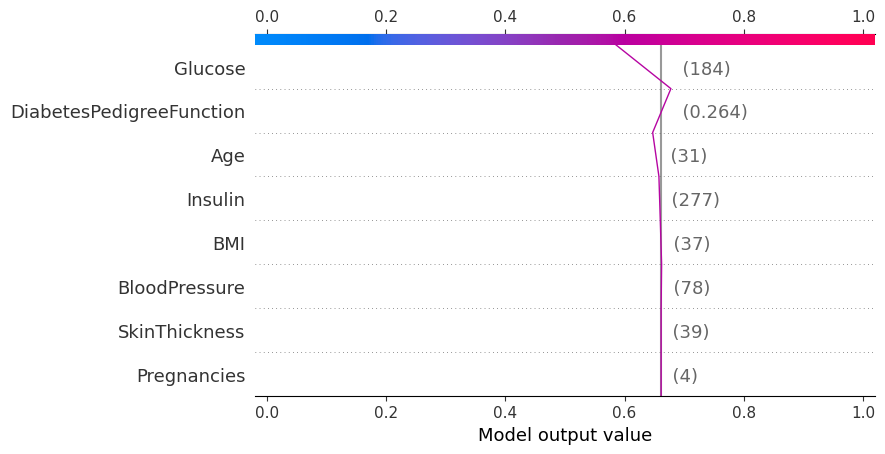

In [90]:
#expected_value_DTC = Shap_explainer_DTC.expected_value
shap.decision_plot(Shap_explainer_DTC.expected_value[0], shap_values_DTC[0][0, :], features=xx_test, link='logit')

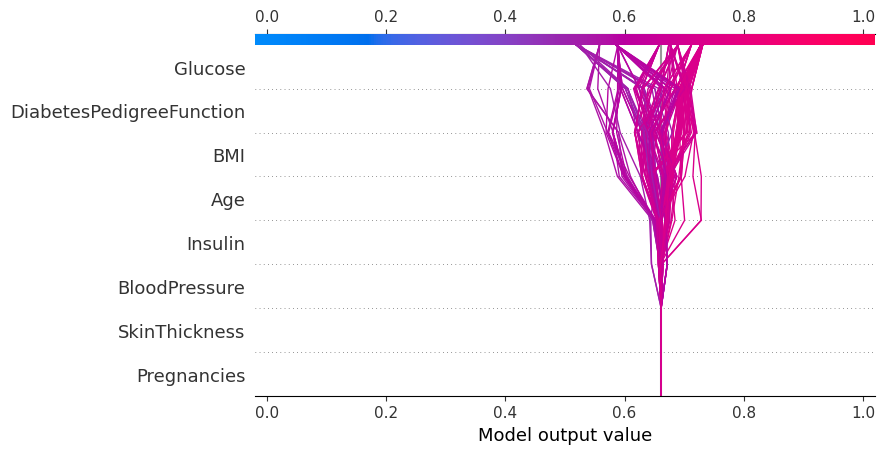

In [91]:
shap.decision_plot(Shap_explainer_DTC.expected_value[0], shap_values_DTC[0], features=xx_test, link='logit')

In [92]:
#treemap of decision tree

tree_structure = DTC_1.tree_

def get_node(node_id, parent):
    if node_id == -1:
        return None
    else:
        node = {
            "node": f"{x_test.columns[tree_structure.feature[node_id]]} decision value= {float(tree_structure.threshold[node_id]):.2f}" 
             if parent != "" else f"{x_test.columns[tree_structure.feature[node_id]]} decision value= {float(tree_structure.threshold[node_id]):.2f}",
            "parent": parent,
        }
        left_child = get_node(tree_structure.children_left[node_id], node["node"])
        right_child = get_node(tree_structure.children_right[node_id], node["node"])
        if left_child:
            node["left_child"] = left_child
        if right_child:
            node["right_child"] = right_child
        return node

root_node = get_node(0, "",)


def flatten_nodes(node):
    nodes = [{"node": node["node"], "parent": node["parent"]}]
    if "left_child" in node:
        nodes.extend(flatten_nodes(node["left_child"]))
    if "right_child" in node:
        nodes.extend(flatten_nodes(node["right_child"]))
    return nodes


nodes = flatten_nodes(root_node)

fig = go.Figure(go.Treemap(
    labels=[node["node"] for node in nodes],
    parents=[node["parent"] for node in nodes],
    customdata=[node["node"] for node in nodes],
))


fig.update_layout(
    title='decision tree Visualization',
)

fig.show()

# SVM

In [94]:
#support vector machine
SVM = SVC(random_state=42,kernel='linear')
SVM.fit(x_train, y_train)

predictions_SVM = SVM.predict(x_test)
print('Score:', accuracy_score(y_test, predictions_SVM))

Score: 0.8057553956834532


In [95]:
#best parameter
param_grid_SVM = {
    'C': [0.001, 0.01, 0.1, 1],
    'gamma': [10, 1, 0.1, 0.01],
    'kernel': ['linear']
}

grid_search_SVM = GridSearchCV(SVM, param_grid_SVM, cv=5, scoring='accuracy')
grid_search_SVM.fit(x_train,y_train)

print("Best Parameters:", grid_search_SVM.best_params_)
print("Best Score:", grid_search_SVM.best_score_)

Best Parameters: {'C': 0.01, 'gamma': 10, 'kernel': 'linear'}
Best Score: 0.7535714285714287


In [96]:
#svm with best parameters
SVM_1 = SVC(C=0.01,
            gamma=10,
            kernel='linear',
            random_state=42,
            probability=True)
SVM_1.fit(x_train, y_train)

predictions_SVM_1 = SVM_1.predict(x_test)
#print('Score:', accuracy_score(y_test, predictions_SVM_1))
predict_test_SVM_1 = SVM_1.predict_proba(x_test)
y_predict_SVM_1 = pd.DataFrame(
{
    "Outcome": predict_test_SVM_1[:, 1],
},
index = y_test.index
    )

print('ROC: ',roc_auc_score(y_test, y_predict_SVM_1))
print('Score: ',DTC_1.score(x_test, y_test))

ROC:  0.8723702664796633
Score:  0.6690647482014388


In [97]:
#roc curve and auc
fpr, tpr, _ = roc_curve(yy_test, y_predict_SVM_1)
roc_auc = auc(fpr, tpr)

fig = px.area(
    x=fpr,
    y=tpr,
    title=f'ROC Curve of SVM (AUC = {roc_auc:.2f})',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
)
fig.add_shape(type='line', line=dict(dash='dash'), x0=0, x1=1, y0=0, y1=1)
fig.update_xaxes(constrain='domain')
fig.update_yaxes(scaleanchor='x', scaleratio=1)
fig.show()

In [98]:
print(classification_report(y_test, predictions_SVM_1))

              precision    recall  f1-score   support

           0       0.81      0.94      0.87        93
           1       0.81      0.57      0.67        46

    accuracy                           0.81       139
   macro avg       0.81      0.75      0.77       139
weighted avg       0.81      0.81      0.80       139



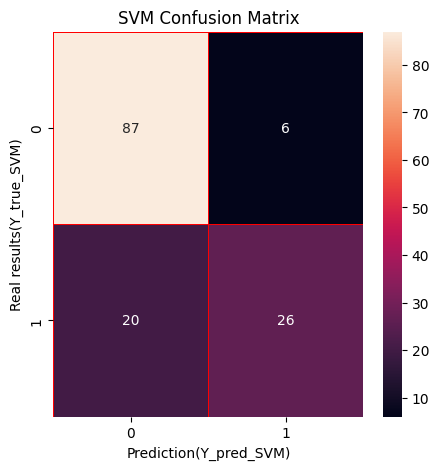

In [99]:
#Confusion Matrix

y_true_SVM = y_test

from sklearn.metrics import confusion_matrix
CM_SVM = confusion_matrix(y_true_SVM,predictions_SVM_1)

f, ax = plt.subplots(figsize=(5,5))
sns.heatmap(CM_SVM, annot = True, linewidths=0.5,linecolor="red",fmt=".0f",ax=ax)
plt.title('SVM Confusion Matrix')
plt.xlabel("Prediction(Y_pred_SVM)")
plt.ylabel("Real results(Y_true_SVM)")
plt.show()

In [100]:
#Show metrics
tp = CM_SVM[1,1]
fn = CM_SVM[1,0]
fp = CM_SVM[0,1]
tn = CM_SVM[0,0]

Accuracy  =  ((tp+tn)/(tp+tn+fp+fn))
Precision =  (tp/(tp+fp))
Recall    =  (tp/(tp+fn))
F1_score  =  (2*(((tp/(tp+fp))*(tp/(tp+fn)))/((tp/(tp+fp))+(tp/(tp+fn)))))

show_metrics = pd.DataFrame(data=[[Accuracy , Precision, Recall, F1_score]])
show_metrics = show_metrics.T

colors = ['lightblue', 'lightgreen', 'lightcoral', 'lightskyblue']

fig = go.Figure(go.Bar(x = (show_metrics[0].values), 
                    y = ['Accuracy', 'Precision', 'Recall', 'F1_score'], text = np.round_(show_metrics[0].values,4),
                    textposition = 'auto', orientation = 'h', opacity = 1, marker=dict(
            color=colors,
            line=dict(color='#000000',width=1))))

fig.update_layout(
    title='SVM preformance',
)

fig.show()

In [101]:
scores = cross_val_score(SVM_1, df_scaled, label, cv=10, scoring='roc_auc')
for i, score in enumerate(scores):
    print(f"Fold {i+1}: {score:.3f}")
#print(f"Mean AUC score: {scores.mean():.3f}"

Fold 1: 0.796
Fold 2: 0.845
Fold 3: 0.840
Fold 4: 0.809
Fold 5: 0.812
Fold 6: 0.837
Fold 7: 0.852
Fold 8: 0.926
Fold 9: 0.853
Fold 10: 0.842


In [102]:
#10-cross validation of SVM

num_cv_runs = 10
scores = cross_val_score(SVM_1, df_scaled, label, cv=10, scoring='roc_auc')
cv_runs = np.arange(1, num_cv_runs + 1)

fig = px.line(x=cv_runs, y=scores, labels={'x': 'CV Run', 'y': 'AUC '}, title='SVM 10-fold Cross-Validation')

fig.update_layout(
    xaxis=dict(tickvals=cv_runs),
    xaxis_title='CV Run',
    yaxis_title=' AUC ',
)

fig.show()


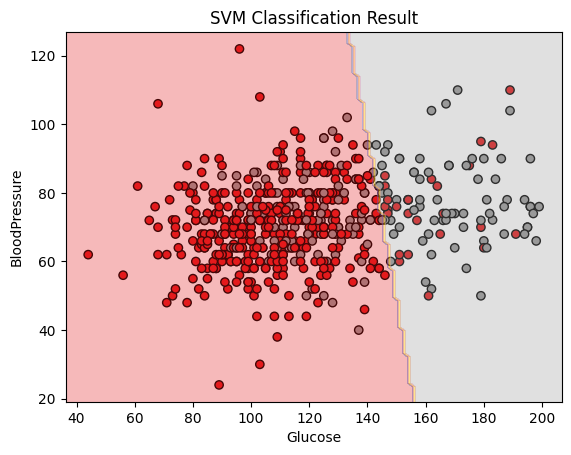

In [103]:
#scatter plot
def SVMvis(Feature_1,Feature_2):
    
    selected_features = [Feature_1, Feature_2]

    SVM_2 = SVC(C=0.01,
                gamma=1,
                kernel='linear',
                random_state=42,
                probability=True)
    SVM_2.fit(xx_train[selected_features], yy_train)

    plt.scatter(xx_train[Feature_1],xx_train[Feature_2],c=yy_train,cmap=plt.cm.Set1, edgecolor='k')

    ax = plt.gca()
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()
    xx, yy = np.meshgrid(np.linspace(xlim[0], xlim[1], 100), np.linspace(ylim[0], ylim[1], 100))
    Z = SVM_2.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    ax.contourf(xx, yy, Z, alpha=0.3, cmap=plt.cm.Set1)

    plt.xlabel(Feature_1)
    plt.ylabel(Feature_2)
    plt.title('SVM Classification Result')

    plt.show()

SVMvis('Glucose', 'BloodPressure')

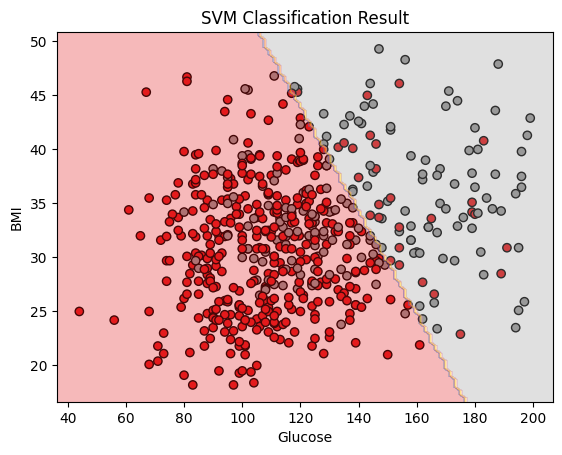

In [104]:
SVMvis('Glucose', 'BMI')

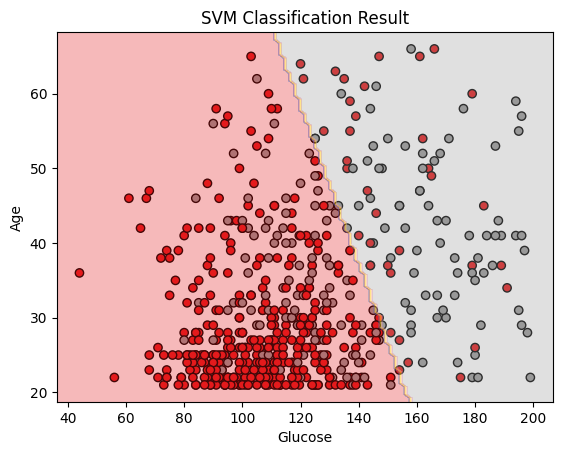

In [105]:
SVMvis('Glucose', 'Age')

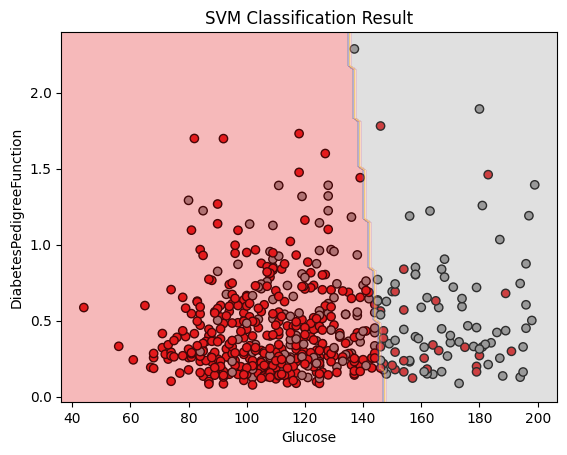

In [106]:
SVMvis('Glucose', 'DiabetesPedigreeFunction')

In [107]:
#lime
Lime_explainer_SVM = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train),
    feature_names=x_train.columns,
    class_names=['0', '1'],
    mode='classification'
)
exp_SVM = Lime_explainer_SVM.explain_instance(data_row=x_test.iloc[0], predict_fn=SVM_1.predict_proba)
exp_SVM.show_in_notebook(show_table=True)


In [108]:
#Weighted kmeans for summary
x_train_summary = shap.kmeans(x_train, 10)

Shap_explainer_SVM = shap.KernelExplainer(SVM_1.predict, x_test)
shap_values_SVM = Shap_explainer_SVM.shap_values(x_test)
#shap_values_SVM[0]

  0%|          | 0/139 [00:00<?, ?it/s]

INFO:shap:num_full_subsets = 4
INFO:shap:phi = [-0.00300617  0.63215999  0.00413669  0.03827509  0.07859712  0.04743919
 -0.02080336 -0.00701439]
INFO:shap:num_full_subsets = 4
INFO:shap:phi = [-1.90390545e-02 -1.60834190e-01 -7.52826310e-03 -2.15399109e-02
  1.65296334e-03  5.99520384e-05  1.12195958e-03 -2.41092840e-02]
INFO:shap:num_full_subsets = 4
INFO:shap:phi = [-0.00181569 -0.19642001 -0.00279205  0.02738952 -0.0270298   0.00457348
 -0.02207948 -0.0120418 ]
INFO:shap:num_full_subsets = 4
INFO:shap:phi = [-0.06196471 -0.29802158  0.01732614  0.02647311 -0.03868619  0.06919322
  0.06650394 -0.01103974]
INFO:shap:num_full_subsets = 4
INFO:shap:phi = [ 0.17203666  0.48354745  0.0299332   0.01206749  0.0022011  -0.01246146
 -0.02650737  0.10896711]
INFO:shap:num_full_subsets = 4
INFO:shap:phi = [ 0.02759507  0.60375128  0.00906132 -0.01550188  0.03684481  0.03268243
  0.02672148  0.04862967]
INFO:shap:num_full_subsets = 4
INFO:shap:phi = [ 0.00274923 -0.2510877   0.00653477  0.02090

INFO:shap:num_full_subsets = 4
INFO:shap:phi = [-0.09694245  0.31801131  0.01254711  0.08779548  0.29319116  0.24781603
 -0.05155019 -0.04108428]
INFO:shap:num_full_subsets = 4
INFO:shap:phi = [-0.03130353 -0.1393371   0.00381124 -0.02058068 -0.01252998 -0.03404419
  0.01938164 -0.01561322]
INFO:shap:num_full_subsets = 4
INFO:shap:phi = [ 0.00253511 -0.12951353 -0.00484755 -0.00054813 -0.00644056 -0.05919836
 -0.01730045 -0.01490236]
INFO:shap:num_full_subsets = 4
INFO:shap:phi = [-0.01731757 -0.13682768 -0.00183282 -0.01647825 -0.02821172 -0.02410072
  0.01479959 -0.02024666]
INFO:shap:num_full_subsets = 4
INFO:shap:phi = [ 6.21188763e-02 -1.68268243e-01  9.42103460e-05  2.95477903e-03
 -1.35748544e-02 -1.23201439e-01 -1.68979102e-02  2.65587530e-02]
INFO:shap:num_full_subsets = 4
INFO:shap:phi = [ 5.63977390e-02  5.89165810e-01  1.07656732e-02 -4.05704008e-02
  3.68276807e-04 -1.76173347e-02  1.20957520e-01  5.03168893e-02]
INFO:shap:num_full_subsets = 4
INFO:shap:phi = [ 0.07842583 

INFO:shap:phi = [ 0.03472079 -0.22000685  0.0029976   0.00724563  0.01502227 -0.01723193
 -0.04898938 -0.00397396]
INFO:shap:num_full_subsets = 4
INFO:shap:phi = [-0.01218739 -0.12971052 -0.01213601  0.00379411 -0.0178914  -0.0279976
 -0.01703494 -0.01705207]
INFO:shap:num_full_subsets = 4
INFO:shap:phi = [-0.09082734  0.26323227 -0.0060209   0.00965228 -0.02743234 -0.06715485
 -0.17128297 -0.14038198]
INFO:shap:num_full_subsets = 4
INFO:shap:phi = [-0.02834875 -0.22865707 -0.00839329  0.02382665 -0.03146626  0.04770469
  0.01942446 -0.02430627]
INFO:shap:num_full_subsets = 4
INFO:shap:phi = [ 0.01581877  0.65173861  0.01330079  0.00389688 -0.00098493  0.02462316
 -0.01864508  0.08003597]
INFO:shap:num_full_subsets = 4
INFO:shap:phi = [0.11766872 0.31314663 0.00495889 0.00554128 0.01943303 0.0158359
 0.2132494  0.07995033]
INFO:shap:num_full_subsets = 4
INFO:shap:phi = [ 0.01016615 -0.1314063  -0.00177287 -0.00216684 -0.0087273  -0.06701781
 -0.029642    0.00035115]
INFO:shap:num_full_

In [109]:
shap_values_SVM[0]

array([-0.00300617,  0.63215999,  0.00413669,  0.03827509,  0.07859712,
        0.04743919, -0.02080336, -0.00701439])

In [110]:
shap.force_plot(Shap_explainer_SVM.expected_value, shap_values_SVM[0,:], x_test.iloc[0, :])

In [111]:
shap.force_plot(Shap_explainer_SVM.expected_value, shap_values_SVM, x_test)

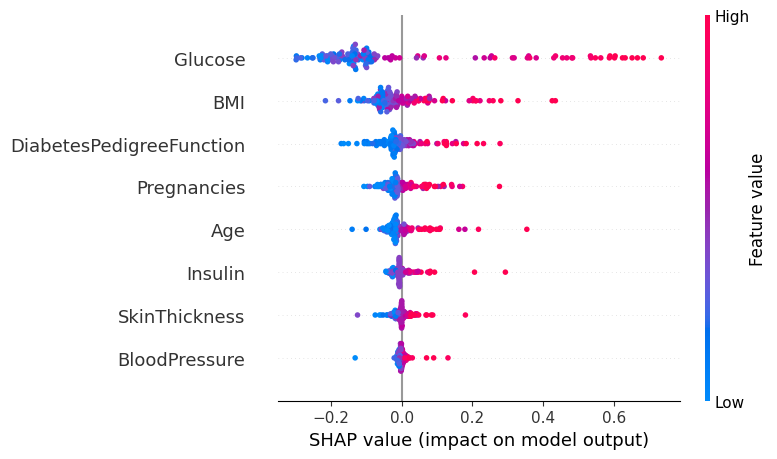

In [112]:
shap.summary_plot(shap_values_SVM, x_test)

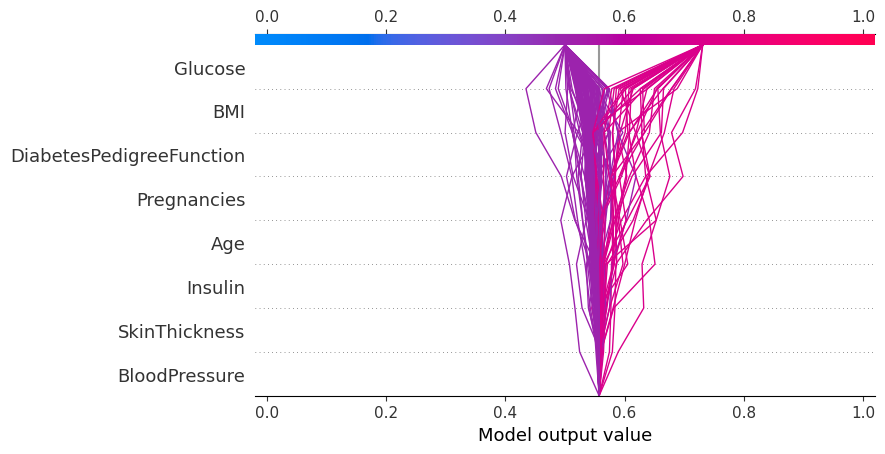

In [113]:
shap.decision_plot(Shap_explainer_SVM.expected_value, shap_values_SVM, x_test, link='logit')

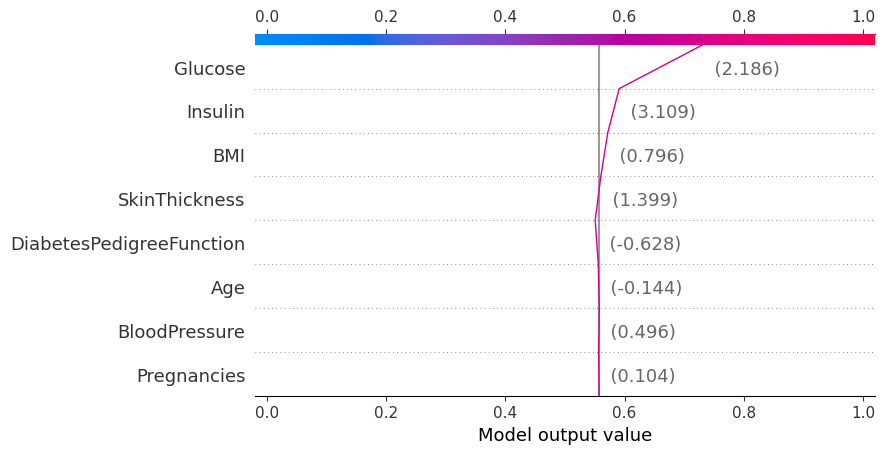

In [114]:
#shap.decision_plot(Shap_explainer_DTC.expected_value[0], shap_values_DTC[0][0, :], features=xx_test, link='logit')
shap.decision_plot(Shap_explainer_SVM.expected_value, shap_values_SVM[0], x_test, link='logit')